In [6]:
import pandas as pd
euc_df = pd.read_csv('/Users/ard/Desktop/ADZE_Pipeline/3pop/DistanceCalc/distances_euclidean.csv')
stdeuc_df = pd.read_csv('/Users/ard/Desktop/ADZE_Pipeline/3pop/DistanceCalc/distances_standardized_euclidean.csv')
corr_df = pd.read_csv('/Users/ard/Desktop/ADZE_Pipeline/3pop/DistanceCalc/distances_correlation.csv')

In [7]:
rbf_df = pd.read_csv('/Users/ard/Desktop/ADZE_Pipeline/3pop/DistanceCalc/distances_rbf.csv')

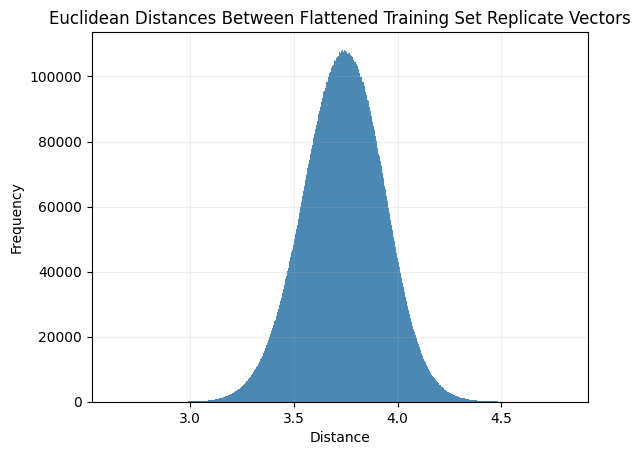

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(1)
bin_edges = np.histogram_bin_edges(euc_df['Distance'], bins='fd')
# Plot histogram using the calculated bin edges
sns.histplot(euc_df['Distance'], bins=bin_edges, kde=False, alpha=0.75)
plt.title('Euclidean Distances Between Flattened Training Set Replicate Vectors')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.grid(alpha=0.2)
plt.show()

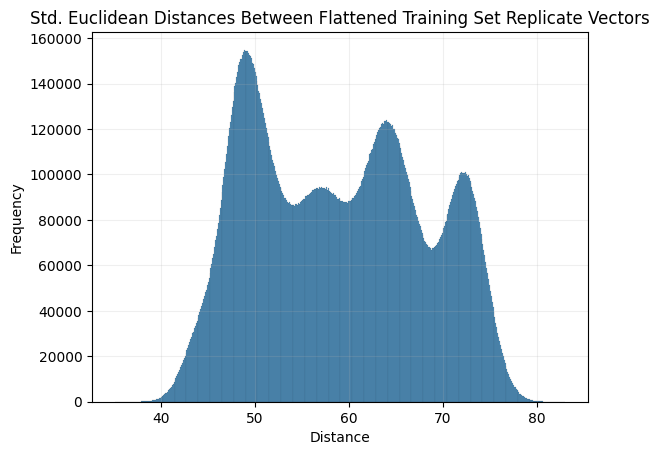

In [118]:
plt.figure(2)
bin_edges = np.histogram_bin_edges(stdeuc_df['Distance'], bins='fd')
plt.title('Std. Euclidean Distances Between Flattened Training Set Replicate Vectors')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.grid(alpha=0.2)
sns.histplot(stdeuc_df['Distance'], bins=bin_edges, kde=False, alpha=0.75)
plt.show()

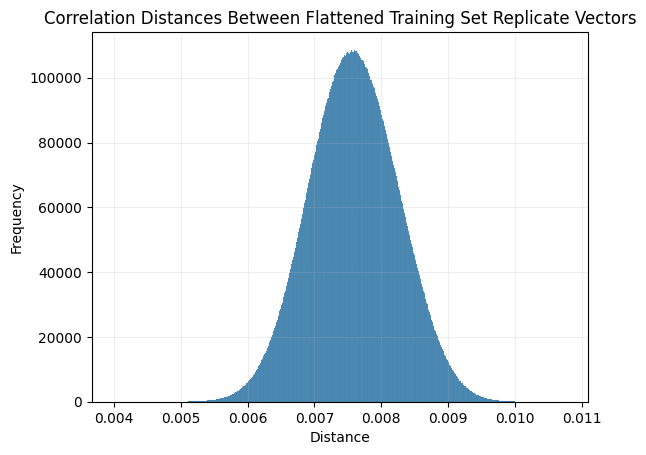

In [119]:
plt.figure(2)
bin_edges = np.histogram_bin_edges(corr_df['Distance'], bins='fd')
plt.title('Correlation Distances Between Flattened Training Set Replicate Vectors')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.grid(alpha=0.2)
sns.histplot(corr_df['Distance'], bins=bin_edges, kde=False, alpha=0.75)
plt.show()

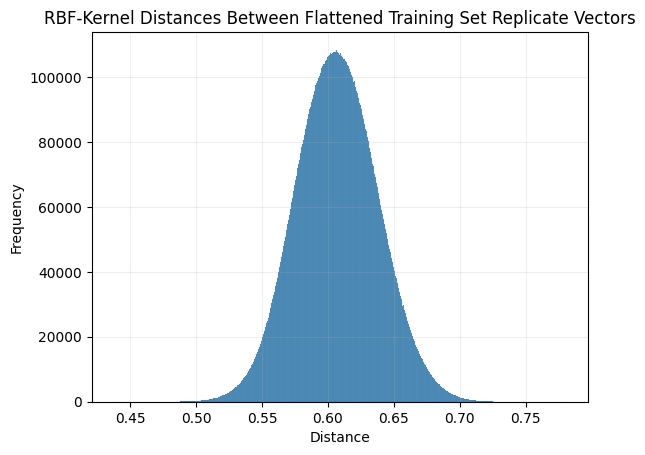

In [120]:
plt.figure(4)
bin_edges = np.histogram_bin_edges(rbf_df['RBF_Distance'], bins='fd')
sns.histplot(rbf_df['RBF_Distance'], bins=bin_edges, kde=False, alpha=0.75)
plt.title('RBF-Kernel Distances Between Flattened Training Set Replicate Vectors')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.grid(alpha=0.2)
plt.show()

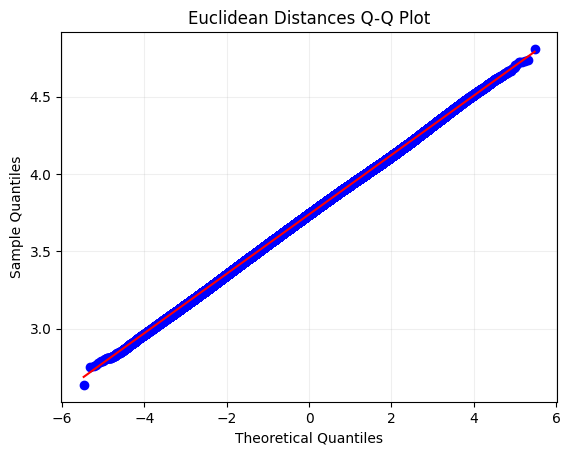

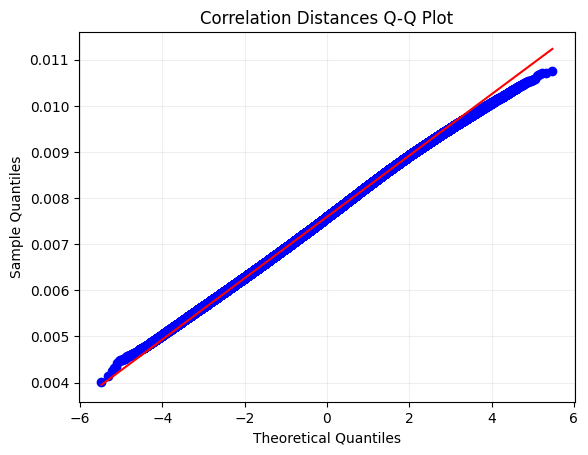

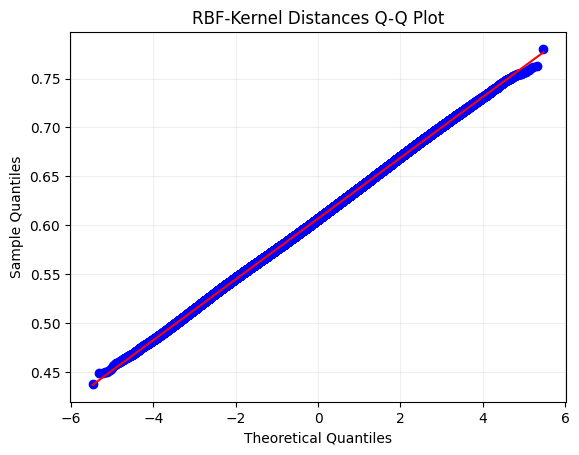

In [125]:
import scipy.stats as stats

# Q-Q plot
plt.figure(1)
stats.probplot(euc_df['Distance'], dist="norm", plot=plt)
plt.title('Euclidean Distances Q-Q Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(alpha=0.2)
plt.show()

plt.figure(2)
stats.probplot(corr_df['Distance'], dist="norm", plot=plt)
plt.title('Correlation Distances Q-Q Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(alpha=0.2)
plt.show()

plt.figure(3)
stats.probplot(rbf_df['RBF_Distance'], dist="norm", plot=plt)
plt.title('RBF-Kernel Distances Q-Q Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(alpha=0.2)
plt.show()

In [52]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import pdist
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics.pairwise import rbf_kernel
from skopt import BayesSearchCV
# Load dataset
file_path = "/Users/ard/Desktop/ADZE_Pipeline/3pop/StratData/training.csv"
df = pd.read_csv(file_path)

In [53]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import pdist
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics.pairwise import rbf_kernel
from skopt import BayesSearchCV

# Function to convert string vector to list of floats
def convert_to_float_vector(string):
    # Remove the parentheses and split by comma
    return [float(x) for x in string.strip('()').split(',')]

def process_data(df, only_mean=True):
    # Initialize the final dictionary
    fin_dict = {}

    # Preprocess columns to convert them into lists of floats
    for column in ['alpha_1', 'alpha_2', 'alpha_3', 'pi_1', 'pi_2', 'pi_3', 'pihat_12', 'pihat_13', 'pihat_23']:
        df[column] = df[column].apply(convert_to_float_vector)

    # Iterate through each unique class and replicate in one go
    grouped = df.groupby(['Class', 'Replicate'])

    for (cls, rep), group in grouped:
        possible_k = sorted(group['k'].unique())

        # Assert all k in [2, 199] are found
        assert possible_k == list(range(2, 200)), f"Missing k values for class {cls} and replicate {rep}"

        fin_v = []

        for column in ['alpha_1', 'alpha_2', 'alpha_3', 'pi_1', 'pi_2', 'pi_3', 'pihat_12', 'pihat_13', 'pihat_23']:
            # Extract the values as a numpy array
            values = np.array(group[column].tolist())

            if only_mean:
                # Keep only the mean value (first element) of each list
                values = values[:, 0]

            # Flatten the values and append to the final vector
            fin_v.extend(values.flatten())

        fin_dict[f"{cls}_{rep}"] = fin_v

    return fin_dict

In [54]:
distance_mu = process_data(df)

In [91]:
distance_mu['A_3']

[1.46694,
 1.57227,
 1.45928,
 1.65702,
 1.62968,
 1.56933,
 1.52841,
 1.59329,
 1.51469,
 1.53868,
 1.57928,
 1.47412,
 1.62256,
 1.49621,
 1.66418,
 1.37707,
 1.67613,
 1.52624,
 1.48411,
 1.63473,
 1.66163,
 1.46317,
 1.35094,
 1.62529,
 1.67556,
 1.66972,
 1.43277,
 1.20106,
 1.54254,
 1.6339,
 1.67268,
 1.64419,
 1.64643,
 1.65902,
 1.66481,
 1.67442,
 1.54808,
 1.53054,
 1.61594,
 1.61197,
 1.4111,
 1.63139,
 1.36896,
 1.27249,
 1.56632,
 1.4933,
 1.30442,
 1.64267,
 1.67032,
 1.63717,
 1.5737,
 1.59798,
 1.66912,
 1.55507,
 1.62164,
 1.61297,
 1.5045,
 1.60248,
 1.66606,
 1.63307,
 1.63636,
 1.67499,
 1.60573,
 1.61787,
 1.40502,
 1.60025,
 1.58587,
 1.61397,
 1.62706,
 1.54442,
 1.59087,
 1.55675,
 1.5367,
 1.36028,
 1.65769,
 1.66291,
 1.61883,
 1.47754,
 1.52402,
 1.66033,
 1.60889,
 1.10921,
 1.16382,
 1.59448,
 1.65429,
 1.6515,
 1.58196,
 1.64791,
 1.66227,
 1.63054,
 1.65566,
 1.49032,
 1.65836,
 1.57653,
 1.41689,
 1.39861,
 1.56783,
 1.59209,
 1.54627,
 1.65498,
 1.6035

In [96]:
10//2

5

In [99]:
# Prepare the lists to create the dataframe
classes = []
replicates = []
vectors = []

for key, vector in result.items():
    class_, replicate = key.split('_')
    classes.append(class_)
    replicates.append(replicate)
    vectors.append(','.join(map(str, vector)))

# Create the dataframe
mu_df = pd.DataFrame({
    'Class': classes,
    'Replicate': replicates,
    'Vector': vectors
})

In [101]:
mu_df

,Class,Replicate,Vector
0,A,3,"0.00024695959595959595,0.0002646919191919192,0..."
1,A,4,"0.0002710791245791246,0.0002765824915824916,0...."
2,A,5,"0.00025862626262626267,0.0002647323232323233,0..."
3,A,6,"0.00025591582491582494,0.0002501868686868687,0..."
4,A,7,"0.0002539090909090909,0.0002471161616161616,0...."
...,...,...,...
7995,E,1996,"0.00025893434343434346,0.00023853535353535356,..."
7996,E,1997,"0.0002655858585858586,0.00026840572390572393,0..."
7997,E,1998,"0.0002525084175084175,0.00023849663299663302,0..."
7998,E,1999,"0.00027540572390572394,0.0002571801346801347,0..."


In [100]:
mu_df.to_csv('./StratData/631Weight_Vectors.csv', index=False)

In [60]:
mu_df

,Class,Replicate,Vector
0,A,3,"1.46694,1.57227,1.45928,1.65702,1.62968,1.5693..."
1,A,4,"1.61021,1.6429,1.60051,1.60546,1.54972,1.48032..."
2,A,5,"1.53624,1.57251,1.62842,1.52968,1.41522,1.1146..."
3,A,6,"1.52014,1.48611,1.6102,1.59074,1.59962,1.60047..."
4,A,7,"1.50822,1.46787,1.53782,1.60195,1.63327,1.5649..."
...,...,...,...
7995,E,1996,"1.53807,1.4169,1.40969,1.59679,1.61294,1.58419..."
7996,E,1997,"1.57758,1.59433,1.52769,1.45315,1.36045,1.5550..."
7997,E,1998,"1.4999,1.41667,1.31443,1.58071,1.28853,1.47922..."
7998,E,1999,"1.63591,1.52765,1.62727,1.45859,1.62107,1.5950..."


In [123]:
# Find the number of unique 'Class'-'Replicate' combinations
unique_combinations = df.drop_duplicates(subset=['Class', 'Replicate']).shape[0]

print(f'Number of unique Class-Replicate combinations: {unique_combinations}')

Number of unique Class-Replicate combinations: 8000


Variance explained by PC1: 0.27
Variance explained by PC2: 0.06
Total variance explained by the first two principal components: 0.33


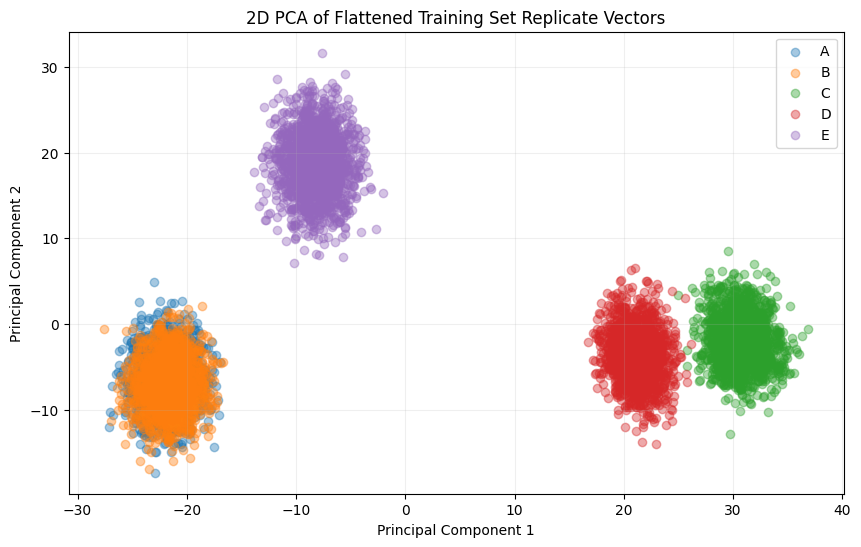

In [111]:
from sklearn.decomposition import PCA
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Convert dictionary to feature matrix and labels
keys = list(distance_mu.keys())
X = np.array(list(distance_mu.values()))
y = np.array([key.split('_')[0] for key in keys])  # Extract class labels

# Standardize the features (important for RBF kernel)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Encode labels as numeric values
unique_labels = sorted(list(set(y)))
label_to_num = {label: idx for idx, label in enumerate(unique_labels)}
y_num = np.array([label_to_num[label] for label in y])

# Generate a custom colormap with distinct colors for each class using tab10 or tab20
num_classes = len(unique_labels)
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(num_classes))
custom_cmap = ListedColormap(colors)

# Visualize with PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
explained_variance_ratio = pca.explained_variance_ratio_
total_variance_explained = np.sum(explained_variance_ratio)
# Print the variance explained by PC1, PC2, and the total variance explained
print(f'Variance explained by PC1: {explained_variance_ratio[0]:.2f}')
print(f'Variance explained by PC2: {explained_variance_ratio[1]:.2f}')
print(f'Total variance explained by the first two principal components: {total_variance_explained:.2f}')


plt.figure(figsize=(10, 6))

# Plot each class with a different color
for i, label in enumerate(unique_labels):
    plt.scatter(X_pca[y_num == i, 0], X_pca[y_num == i, 1], color=custom_cmap(i), label=label, alpha=0.4)

plt.title('2D PCA of Flattened Training Set Replicate Vectors')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(alpha=0.2)
plt.legend()
plt.show()

In [9]:
euc_df

,Replicate1,Replicate2,Distance
0,A_3,A_4,3.789227
1,A_3,A_5,3.711734
2,A_3,A_6,3.854046
3,A_3,A_7,3.887968
4,A_3,A_8,3.801779
...,...,...,...
31995995,E_1997,E_1999,3.695878
31995996,E_1997,E_2000,3.441138
31995997,E_1998,E_1999,3.353299
31995998,E_1998,E_2000,3.597897


In [3]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Read the dataset from the specified path
data = pd.read_csv('StratData/631Weight_Vectors.csv')

# Function to extract float values from the 'Vector' column
def extract_floats(vector):
    return np.array(vector.split(",")).astype(float)

# Extract float values from 'Vector' column and create a new dataset
float_values = np.vstack(data['Vector'].apply(extract_floats))
float_values_df = pd.DataFrame(float_values, columns=[f"V{i+1}" for i in range(float_values.shape[1])])

# Perform PCA without scaling
pca = PCA(n_components=2)
pca_coords = pca.fit_transform(float_values)

# Perform PCA with scaling
scaler = StandardScaler()
float_values_scaled = scaler.fit_transform(float_values)
pca_scaled = PCA(n_components=2)
pca_scaled_coords = pca_scaled.fit_transform(float_values_scaled)

# Add class labels to the PCA results
pca_df = pd.DataFrame(pca_coords, columns=['PC1', 'PC2'])
pca_df['Class'] = data['Class'].values

pca_scaled_df = pd.DataFrame(pca_scaled_coords, columns=['PC1', 'PC2'])
pca_scaled_df['Class'] = data['Class'].values

# Plot PCA without scaling and with scaling with points colored by Class
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Class', palette='tab10')
plt.title('PCA Plot without Scaling')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(data=pca_scaled_df, x='PC1', y='PC2', hue='Class', palette='tab10')
plt.title('PCA Plot with StandardScaler')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

plt.tight_layout()
plt.show()


/Users/ard/Desktop/genenv/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


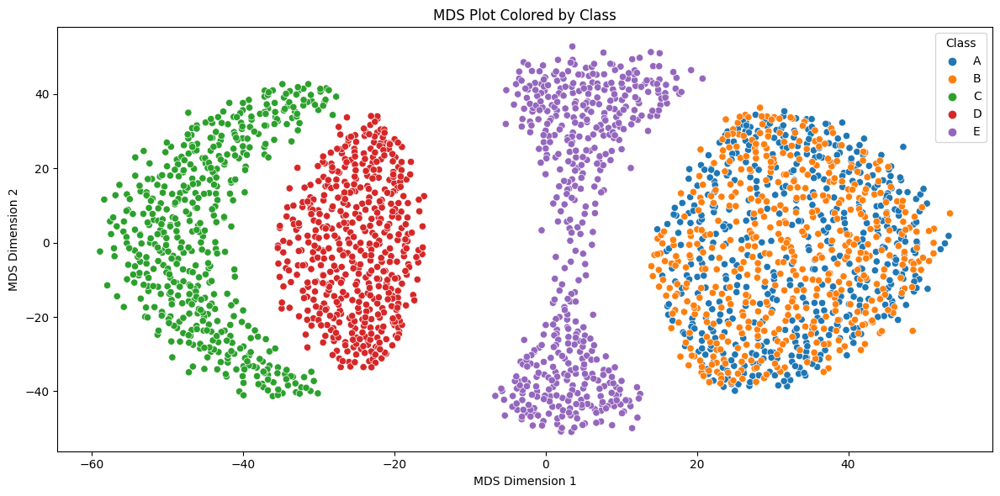

In [1]:
import pandas as pd
import numpy as np
from sklearn.manifold import MDS
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

# Read the dataset from the specified path
data = pd.read_csv('./StratData/Training_Vectors.csv')

# Function to extract float values from the 'Vector' column
def extract_floats(vector):
    return np.array(vector.split(",")).astype(float)

# Downsample the dataset by picking one random replicate for each unique class
data_sampled = data.groupby('Class').apply(lambda x: x.sample(500)).reset_index(drop=True)

# Extract float values from 'Vector' column and create a new dataset
float_values = np.vstack(data_sampled['Vector'].apply(extract_floats))
float_values_df = pd.DataFrame(float_values, columns=[f"V{i+1}" for i in range(float_values.shape[1])])

# Standardize the features
scaler = StandardScaler()
float_values_scaled = scaler.fit_transform(float_values_df)

# Compute Euclidean distance matrix for MDS using scipy
distance_matrix = squareform(pdist(float_values_scaled, metric='euclidean'))

# Perform Classical MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42, metric=True)
mds_coords = mds.fit_transform(distance_matrix)

# Add class labels to the MDS results
mds_df = pd.DataFrame(mds_coords, columns=['Dim.1', 'Dim.2'])
mds_df['Class'] = data_sampled['Class'].values

# Plot MDS with points colored by Class
plt.figure(figsize=(12, 6))
sns.scatterplot(data=mds_df, x='Dim.1', y='Dim.2', hue='Class', palette='tab10')
plt.title('MDS Plot Colored by Class')
plt.xlabel('MDS Dimension 1')
plt.ylabel('MDS Dimension 2')
plt.tight_layout()
plt.show()


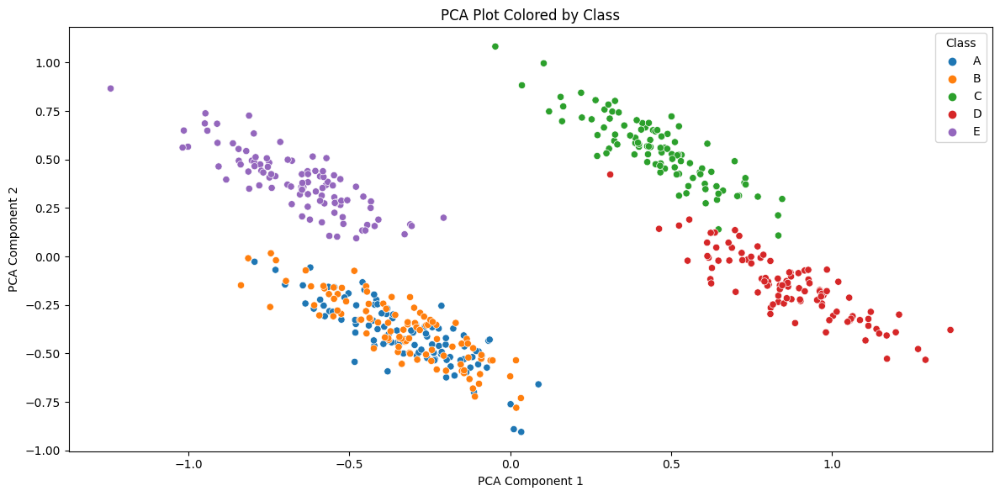

In [72]:
# Perform PCA
pca = PCA(n_components=2)
pca_coords = pca.fit_transform(float_values)

# Plot MDS with points colored by Class
plt.figure(figsize=(12, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Class', palette='tab10')
plt.title('PCA Plot Colored by Class')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

plt.tight_layout()
plt.show()


In [71]:
float_values

array([[1.50808  , 1.42796  , 1.53335  , ..., 0.0182718, 0.018768 ,
        0.0267139],
       [1.57925  , 1.55328  , 1.48729  , ..., 0.021288 , 0.0215197,
        0.0245399],
       [1.62815  , 1.44019  , 1.10726  , ..., 0.0244515, 0.0328246,
        0.0164359],
       ...,
       [1.57435  , 1.56014  , 1.52967  , ..., 0.0233654, 0.0244235,
        0.0219207],
       [1.57756  , 1.472    , 1.60916  , ..., 0.0199524, 0.0223851,
        0.0217144],
       [1.57385  , 1.59415  , 1.40663  , ..., 0.0256741, 0.0268678,
        0.0304009]])

In [49]:
import pandas as pd
import numpy as np
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
import seaborn as sns

def compute_mds(data, title):
    # Extract unique vectors
    vectors = sorted(set(data['Replicate1']).union(set(data['Replicate2'])))
    
    # Create a mapping from vector names to indices
    vector_indices = {vector: idx for idx, vector in enumerate(vectors)}
    
    # Initialize the distance matrix with NaNs for proper handling of missing values
    n = len(vectors)
    distance_matrix_df = pd.DataFrame(np.nan, index=vectors, columns=vectors)

    # Pivot the DataFrame to get the upper triangle in matrix form
    pivot_df = data.pivot(index='Replicate1', columns='Replicate2', values='Distance')

    # Fill the distance matrix with the upper triangle values and its transpose
    distance_matrix_df.update(pivot_df)
    distance_matrix_df.update(pivot_df.T)

    # Set the diagonal to 0
    np.fill_diagonal(distance_matrix_df.values, 0)

    # Check for missing values and handle appropriately
    if distance_matrix_df.isnull().values.any():
        missing_indices = np.where(distance_matrix_df.isnull())
        print("Missing values found at indices:", missing_indices)
        raise ValueError("The distance matrix contains missing values. Please ensure the matrix is fully populated.")

    # Convert the DataFrame to a NumPy array
    distance_matrix = distance_matrix_df.values

    # Ensure the distance matrix is symmetric
    if not np.allclose(distance_matrix, distance_matrix.T):
        raise ValueError("The distance matrix is not symmetric. Please check the input data.")

    print('Done filling matrix')
    
    # Perform MDS with parallel computation
    mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42, n_jobs=-1, n_init=1, max_iter=300)
    mds_coords = mds.fit_transform(distance_matrix)

    # Extract classes from vector names (first character of each vector)
    classes = [vector[0] for vector in vectors]

    class_labels = sorted(list(set(classes)))
    class_to_num = {label: num for num, label in enumerate(class_labels)}
    numeric_classes = [class_to_num[cls] for cls in classes]

    # Create a colormap
    cmap = plt.get_cmap('tab10')
    colors = [cmap(class_to_num[cls]) for cls in classes]

    # Plot the MDS results with subplots for each class
    fig, axes = plt.subplots(1, len(class_labels) + 1, figsize=(25, 8), gridspec_kw={'width_ratios': [3] + [1]*len(class_labels)})

    # Main MDS plot
    scatter = axes[0].scatter(mds_coords[:, 0], mds_coords[:, 1], c=colors, alpha=0.6)
    axes[0].set_xlabel('MDS Dimension 1')
    axes[0].set_ylabel('MDS Dimension 2')
    axes[0].set_title(title)
    axes[0].grid(alpha=0.2)

    # Create a legend
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(class_to_num[label]), markersize=10, label=label) for label in class_labels]
    axes[0].legend(handles=legend_elements, title="Classes")

    # Set the limits for subplots to match the main plot
    x_lim = axes[0].get_xlim()
    y_lim = axes[0].get_ylim()

    # Subplots for each class
    for idx, label in enumerate(class_labels):
        class_mask = np.array(classes) == label
        ax = axes[idx + 1]
        ax.scatter(mds_coords[class_mask, 0], mds_coords[class_mask, 1], color=cmap(class_to_num[label]), alpha=0.6)
        ax.set_title(label)
        ax.grid(alpha=0.2)
        ax.set_xlim(x_lim)
        ax.set_ylim(y_lim)
        ax.set_xticks(np.linspace(x_lim[0], x_lim[1], 5))
        ax.set_yticks(np.linspace(y_lim[0], y_lim[1], 5))
        ax.set_aspect('equal', 'box')  # Set aspect ratio to be equal

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.3)  # Adjust the space between subplots
    plt.show()

# Example usage
# Assuming 'data' is your DataFrame with 'Replicate1', 'Replicate2', and 'Distance' columns
# compute_mds(data, 'MDS Plot with Class Subplots')


Done filling matrix


/Users/ard/Desktop/genenv/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


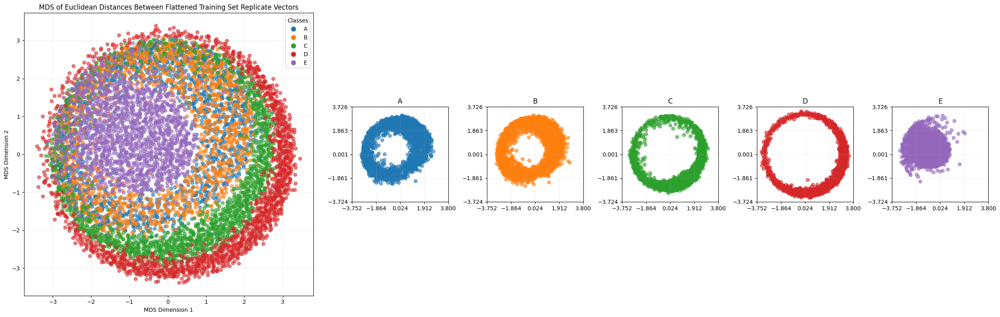

KeyboardInterrupt: 

In [50]:
euc_coords = compute_mds(euc_df, 'MDS of Euclidean Distances Between Flattened Training Set Replicate Vectors')
stdeuc_coords = compute_mds(stdeuc_df, 'MDS of Std. Euclidean Distances Between Flattened Training Set Replicate Vectors')
corr_coords = compute_mds(corr_df, 'MDS of Correlation Distances Between Flattened Training Set Replicate Vectors')
rbf_coords = compute_mds(rbf_df, 'MDS of RBF-Kernel Distances Between Flattened Training Set Replicate Vectors')

In [ ]:
    # Extract classes from vector names (first character of each vector)
    classes = [vector[0] for vector in vectors]

    class_labels = sorted(list(set(classes)))
    class_to_num = {label: num for num, label in enumerate(class_labels)}
    numeric_classes = [class_to_num[cls] for cls in classes]

    # Create a colormap
    cmap = plt.get_cmap('tab10')
    colors = [cmap(class_to_num[cls]) for cls in classes]

    # Plot the MDS results
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(mds_coords[:, 0], mds_coords[:, 1], c=colors, alpha=0.6)

    # Create a legend
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(class_to_num[label]), markersize=10, label=label) for label in class_labels]
    plt.legend(handles=legend_elements, title="Classes")

    # Add labels and title
    plt.xlabel('MDS Dimension 1')
    plt.ylabel('MDS Dimension 2')
    plt.title('MDS Plot Colored by Class')
    plt.show()

Done filling matrix


/Users/ard/Desktop/genenv/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


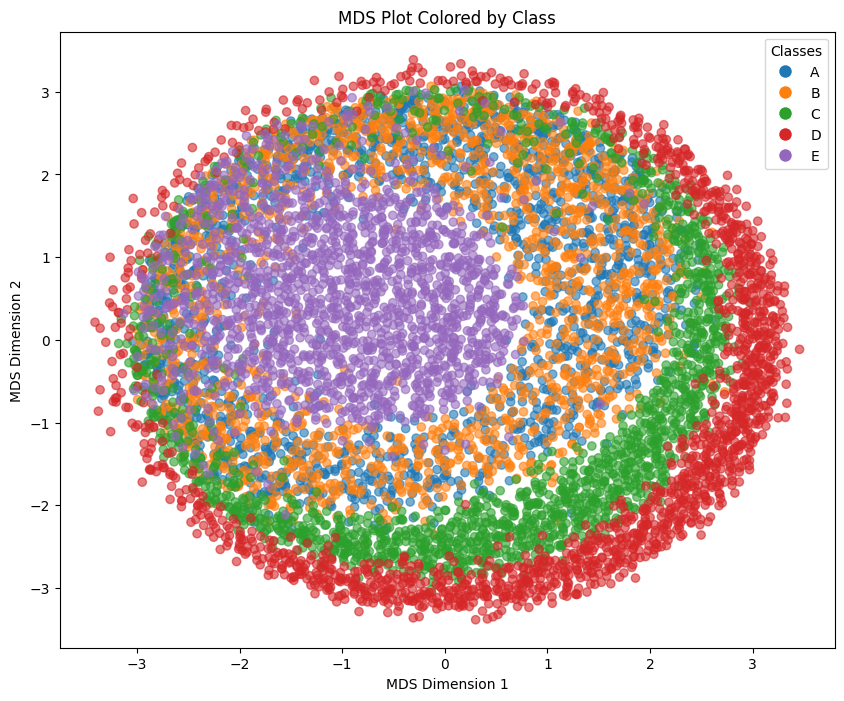

array([[-0.80833309,  2.29249809],
       [-2.65820906, -0.62714732],
       [ 0.01772952, -1.63446861],
       ...,
       [-1.72996839,  2.06409007],
       [-0.48438523,  2.1373053 ],
       [-0.38362484,  1.62166902]])

In [29]:
compute_mds(euc_df)

Done filling matrix


/Users/ard/Desktop/genenv/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


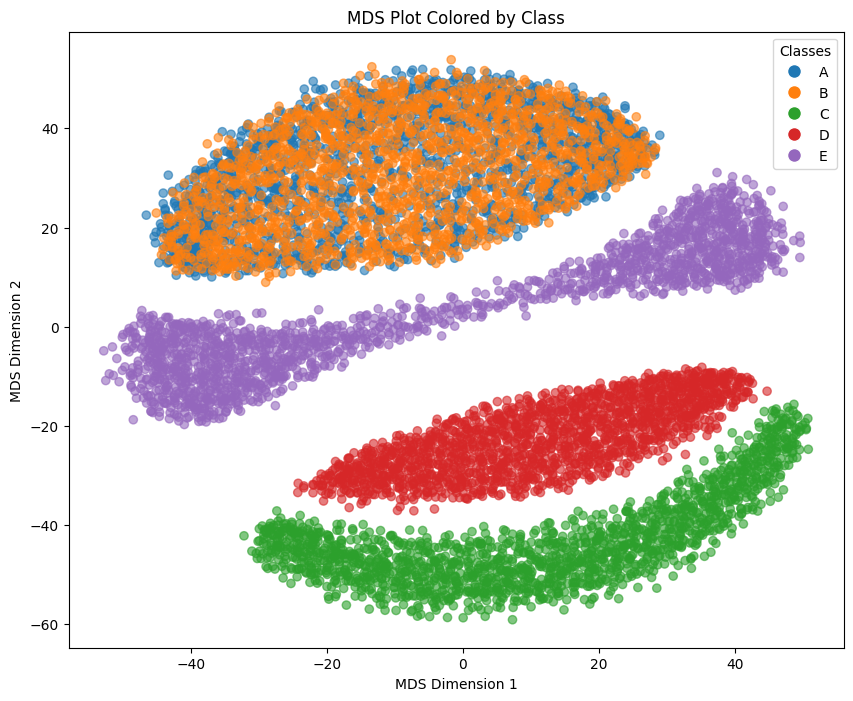

array([[-23.13467269,  46.35722505],
       [-40.64475493,  25.15584901],
       [-25.36216179,  13.62107542],
       ...,
       [ 43.7083115 ,  20.09256109],
       [ 44.09003454,  19.00779836],
       [ 38.84716718,   9.43822948]])

In [30]:
compute_mds(stdeuc_df)

Done filling matrix


/Users/ard/Desktop/genenv/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


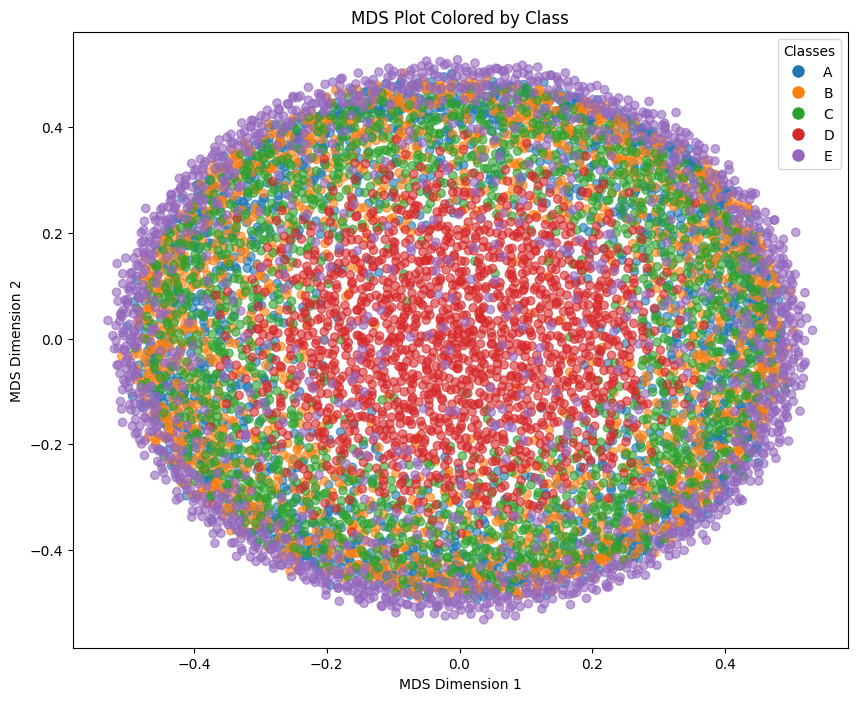

array([[-0.01317319,  0.44470668],
       [-0.3523746 , -0.0754922 ],
       [-0.05738574, -0.44997925],
       ...,
       [ 0.06011892,  0.34537292],
       [ 0.3427665 ,  0.1727162 ],
       [ 0.41319105,  0.24534711]])

In [31]:
compute_mds(rbf_df)

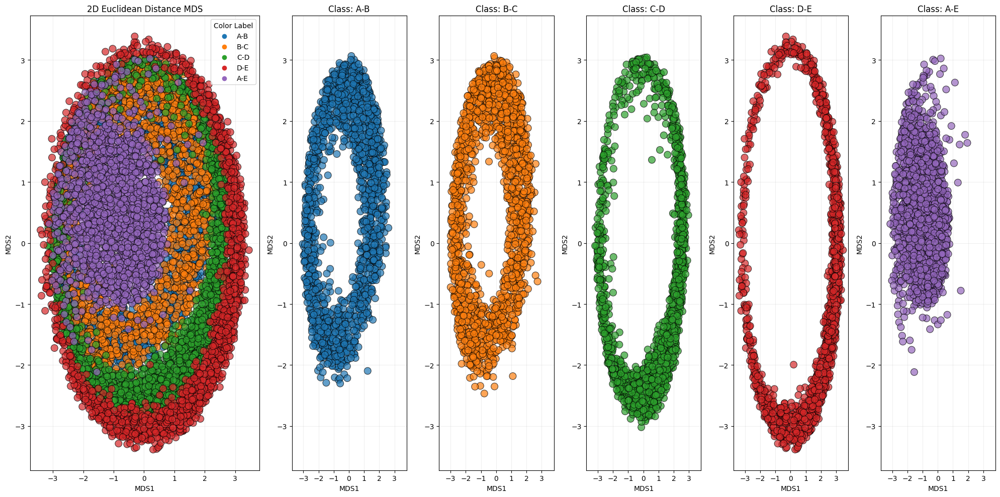

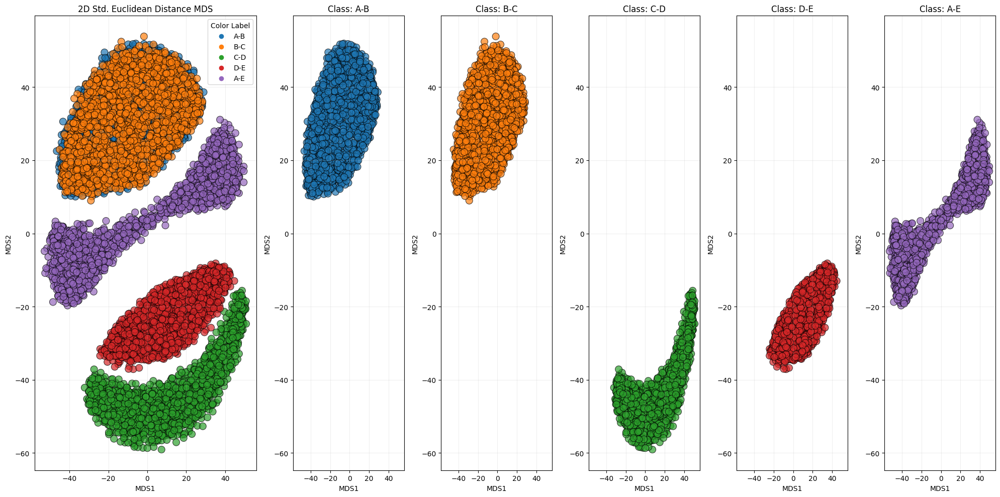

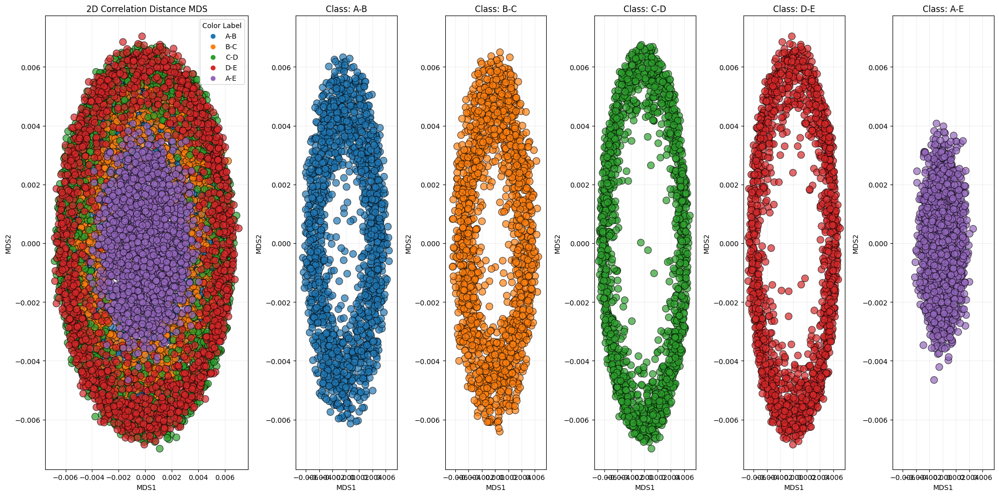

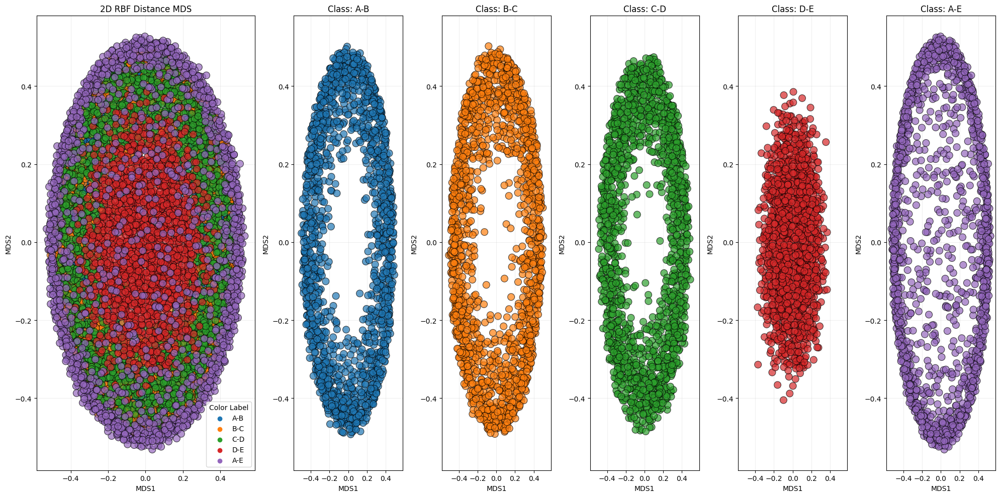

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec

# Function to plot MDS results with subplots for each class
# Function to plot MDS results with subplots for each class
def plot_mds_with_subplots(mds_df, title):
    unique_labels = mds_df['Color_Label'].unique()
    num_classes = len(unique_labels)
    
    # Create a figure with GridSpec to control the size ratios of the subplots
    fig = plt.figure(figsize=(20, 10))
    gs = gridspec.GridSpec(1, num_classes + 1, width_ratios=[3] + [1.5] * num_classes)
    
    # Plot the combined MDS results
    ax_main = plt.subplot(gs[0])
    sns.scatterplot(ax=ax_main, data=mds_df, x='MDS1', y='MDS2', hue='Color_Label', palette='tab10', s=100, alpha=0.7, edgecolor='k')
    ax_main.set_title(title)
    ax_main.legend(title='Color Label')
    ax_main.grid(alpha=0.2)
    
    # Get the palette used for the main plot
    palette = sns.color_palette('tab10', num_classes)
    color_dict = dict(zip(unique_labels, palette))
    
    # Plot each class separately
    for i, label in enumerate(unique_labels):
        ax = plt.subplot(gs[i + 1], sharex=ax_main, sharey=ax_main)
        sns.scatterplot(ax=ax, data=mds_df[mds_df['Color_Label'] == label], x='MDS1', y='MDS2', hue='Color_Label', palette=color_dict, s=100, alpha=0.7, edgecolor='k', legend=False)
        ax.set_title(f'Class: {label}')
        ax.grid(alpha=0.2)
    
    plt.tight_layout()
    plt.show()


# Example usage for the Std. Euclidean Distance MDS results
plot_mds_with_subplots(euc_mds, '2D Euclidean Distance MDS')

# Example usage for the Std. Euclidean Distance MDS results
plot_mds_with_subplots(stdeuc_mds, '2D Std. Euclidean Distance MDS')

# Repeat similar modifications for the other MDS results
# Example usage for the Correlation Distance MDS results
plot_mds_with_subplots(corr_mds, '2D Correlation Distance MDS')

# Example usage for the RBF Distance MDS results
plot_mds_with_subplots(rbf_mds, '2D RBF Distance MDS')
